## Part 3 - Blob detection
#### *Pol Roca Llaberia*


### BRIEF vs ORB

Binary Robust Independent Elementary Features or **BRIEF** is a method for generating feature point descriptors based on binary features which result from comparing several pairs of points in a local region. Its most remarkable advantages are that it is fast and memory efficient compared to other descriptors. However, it has a remarkable drawback that is not being invariant to rotation.

On the other hand, Oriented FAST and Rotated BRIEF or **ORB** is a feature extractor *and* descriptor that is fast as well, but in this case thanks to some improvements in the algorithms employed (FAST and BRIEF), it is also invariant to rotation and scale. In theory, ORB is supposed to outperform BRIEF since it is build on top of it and in order to improve its shortcomings, but we will see.

In this notebook we will perform a comparison of these two methods with different images and different homographies applied to them, in order to test their robustness to these distortions. In particular, we will apply rotation (for what we explained), as well as blurring and changes in perspective. We will not test adding noise to images although both descriptors are sensitive to it for being binary descriptors, simply because they use the same algorithm and share the same solution to that problem (recommended in BRIEF's paper) which is to smooth the image beforehand, so a similar response would be expected anyway.

In [1]:
import numpy as np
from matplotlib import pyplot as plt

from skimage import data
from skimage.color import rgb2gray
from skimage.filters import gaussian
from skimage.transform import warp, ProjectiveTransform, rotate
from skimage.feature import (match_descriptors, corner_peaks, corner_harris,
                             plot_matches, BRIEF, ORB)
plt.gray()

<Figure size 432x288 with 0 Axes>

In [2]:
def plot_descriptors_comparison(img1, img2, ax):
    img1 = rgb2gray(img1) if img1.ndim > 2 else img1
    img2 = rgb2gray(img2) if img2.ndim > 2 else img2

    # BRIEF
    harris_keypoints1 = corner_peaks(corner_harris(img1), min_distance=5,
                              threshold_rel=0.1)
    harris_keypoints2 = corner_peaks(corner_harris(img2), min_distance=5,
                              threshold_rel=0.1)
    brief = BRIEF()
    brief.extract(img1, harris_keypoints1)
    harris_keypoints1 = harris_keypoints1[brief.mask]
    brief_descriptors1 = brief.descriptors

    brief.extract(img2, harris_keypoints2)
    harris_keypoints2 = harris_keypoints2[brief.mask]
    brief_descriptors2 = brief.descriptors

    # if no matches are found, add placeholder
    # to still plot the images
    if len(brief_descriptors2) == 0: 
        brief_descriptors2 = np.full((1, 256), -1)
        harris_keypoints2 = np.full((1, 2), -10000)

    brief_matches = match_descriptors(brief_descriptors1, brief_descriptors2, cross_check=True)
    plot_matches(ax[0], img1, img2, harris_keypoints1, harris_keypoints2, brief_matches)
    ax[0].set_title('BRIEF ({}/{} matches)'.format(len(brief_matches), min(len(harris_keypoints1), len(harris_keypoints2))))
    ax[0].set_axis_off()

    # ORB
    orb = ORB(n_keypoints=200)
    orb.detect_and_extract(img1)
    orb_keypoints1 = orb.keypoints
    orb_descriptors1 = orb.descriptors

    orb.detect_and_extract(img2)
    orb_keypoints2 = orb.keypoints
    orb_descriptors2 = orb.descriptors

    orb_matches = match_descriptors(orb_descriptors1, orb_descriptors2, cross_check=True)
    plot_matches(ax[1], img1, img2, orb_keypoints1, orb_keypoints2, orb_matches)
    ax[1].set_title('ORB ({}/{} matches)'.format(len(orb_matches), min(len(orb_keypoints1), len(orb_keypoints2))))
    ax[1].set_axis_off()

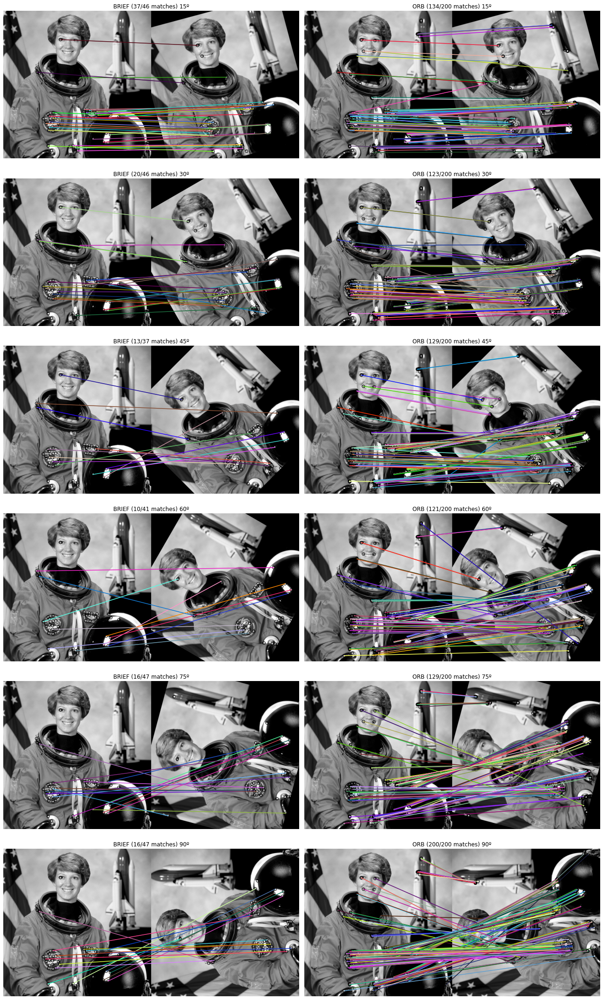

In [3]:
img1 = data.astronaut()
img1 = rgb2gray(img1)

fig, ax = plt.subplots(6, 2, figsize=(18, 30))
for i, angle in enumerate(range(15, 91, 15)):
    img2 = rotate(img1, angle=angle)
    plot_descriptors_comparison(img1, img2, ax[i])

    # print angle within title
    ax[i, 0].set_title(ax[i, 0].title.get_text() + f' {angle}º')
    ax[i, 1].set_title(ax[i, 1].title.get_text() + f' {angle}º')

plt.tight_layout()
plt.show()

In this first image of the astronaut we have tested the algorithms on successive rotations of the image. To start with, we can see that BRIEF generally finds less keypoints comparted to ORB. That is because BRIEF is a feature descriptor, and thus, we have to apply a keypoint or corner detector before that (in our case, Harris corners) in order to extract descriptors from them. On the contrary, ORB uses FAST and it always detects a minimum of *n* points, specified by parameter.

From the 15º rotation we can see that, even though BRIEF is not natively robust to rotation, it has still been able to find most of the matches. Next up with the 30º rotation, we also observe that behavior but only to some extent, as in this case, less matches have been found and even then many of them are not even correct correspondences. Things have gotten significantly worse after this point, and from this image we can tell BRIEF starts having problems with rotations of >30º.

This case is totally different with ORB. ORB has managed to find around 130 matches consistenly across all rotations, which is approximately x4 more than BRIEF most of the times. Most importantly, if we take a closer look we can see that these matches are in majority correct; they refer to the same points in both images. Another remarkable observation is that this method has successfully found all the possible matches in the image rotated 90º to the left. More into that, the best results were obtained from images with rotations closer to 0º and 90º degrees, which leads us to think that ORB is more robust to rotations closer to angles equal to 0 mod 90. That could mean that ORB has weak or sweet spots, depending on how we see it.

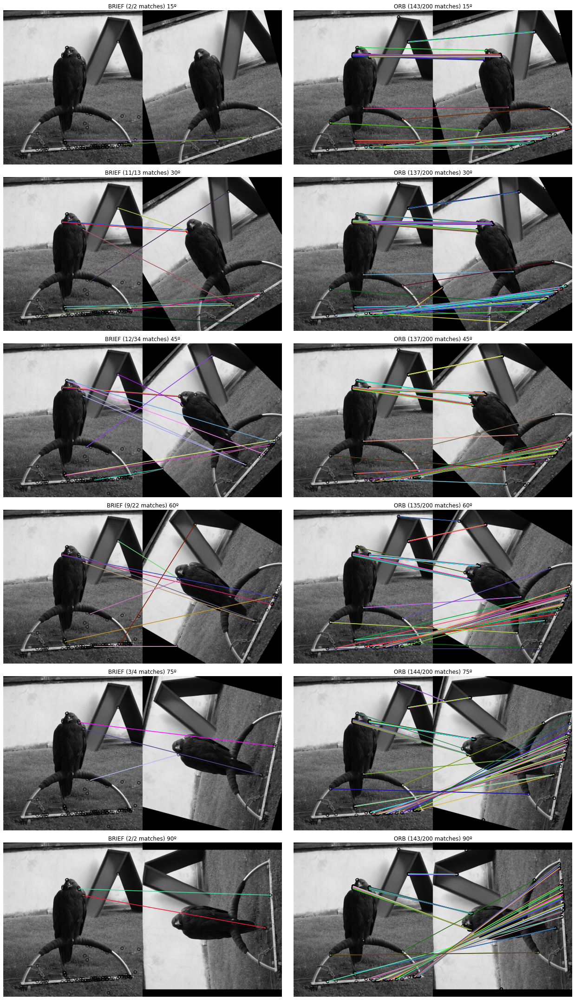

In [4]:
img1 = data.eagle()
img1 = rgb2gray(img1)

fig, ax = plt.subplots(6, 2, figsize=(18, 30))
for i, angle in enumerate(range(15, 91, 15)):
    img2 = rotate(img1, angle=angle)
    plot_descriptors_comparison(img1, img2, ax[i])

    # print angle within title
    ax[i, 0].set_title(ax[i, 0].title.get_text() + f' {angle}º')
    ax[i, 1].set_title(ax[i, 1].title.get_text() + f' {angle}º')

plt.tight_layout()
plt.show()

In this second case we analyze a similar test but with a different image. Here, we can see that BRIEF directly shows a totally random behaviour in contrast with the last image where small rotations did not affect the results by that much. This confirms the inconsistency that BRIEF provides, which was not unexpected since it is known to be an approach variable to rotation.

On the other side, ORB has expectedly found many matches regardless of the rotation applied (even more than in the previous one), which goes accordingly with its capabilities.

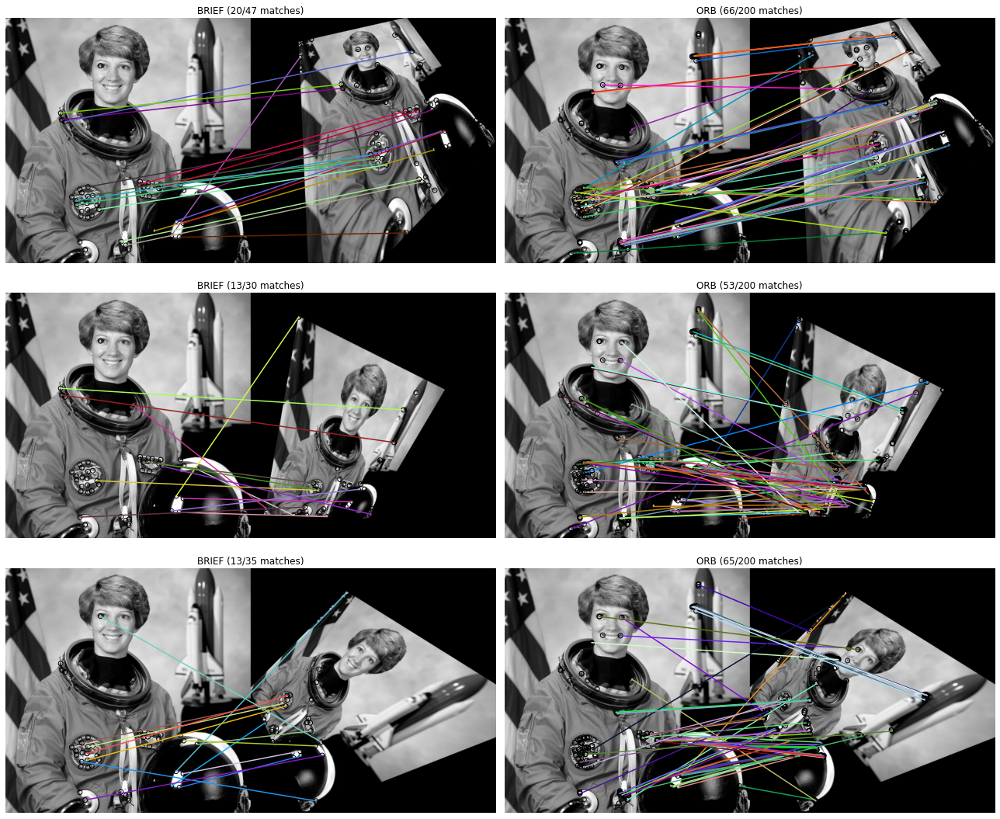

In [7]:
img1 = data.astronaut()
img1 = rgb2gray(img1)

proj_matrices = [
    np.array([[0.7, -0.1, 100],
              [-0.1, 0.4, 50],
              [0.0008, -0.0012, 1]]),
    np.array([[1, -0.1, 100],
              [0.5, 1.5, 50],
              [0.001, 0.0015, 1]]),
    np.array([[0.2, -0.4, 200],
              [0.2, 0.6, 50],
              [-0.001, 0.0008, 1]])
]

fig, ax = plt.subplots(3, 2, figsize=(18, 15))
for i, matrix in enumerate(proj_matrices):
    tform = ProjectiveTransform(matrix=matrix)
    img2 = warp(img1, tform.inverse)
    plot_descriptors_comparison(img1, img2, ax[i])

plt.tight_layout()
plt.show()

With this experiment we can analyze the performance of BRIEF and ORB when we apply projection transformations on an image. This type of transformations involve (all combined) non-uniform scaling, rotations, and the disruption of lines that previously were parallel, among other distortions. Here, we applied 3 different projections.

In the first projection transformation that does not imply a noticeable rotation, we can see that both BRIEF and ORB have managed to find some matches. It is easy to see that ORB has found many more matches, but it is interesting to see that the majority of the matches proposed by BRIEF are actually correct, if we take a closer look. 

In the second transformation, we could say that BRIEF has failed in finding matches even though, again, the image was not rotated that much. The ORB method as also struggled to find correspondences and many of the matches proposed are incorrect, however, thanks to some concrete points on the helmet and the toy spaceship, we can say that a good proportion of the matches have been properly located.

Finally, the third transformation does involve a significant rotation, which is probably what has lead BRIEF to provide a very poor result. BRIEF's result is similar to the previous one, with the exception of some proper matches on the logo of her jacket. It could be because of that rotation that ORB has shown a fairly good result, taking into account that we are applying an affine transformation. ORB has proposed less noisy matches in comparison with the previous result, and it also has found more consistent matches in addition to the ones on the helmet and spaceship that seemingly, they were found in every case.

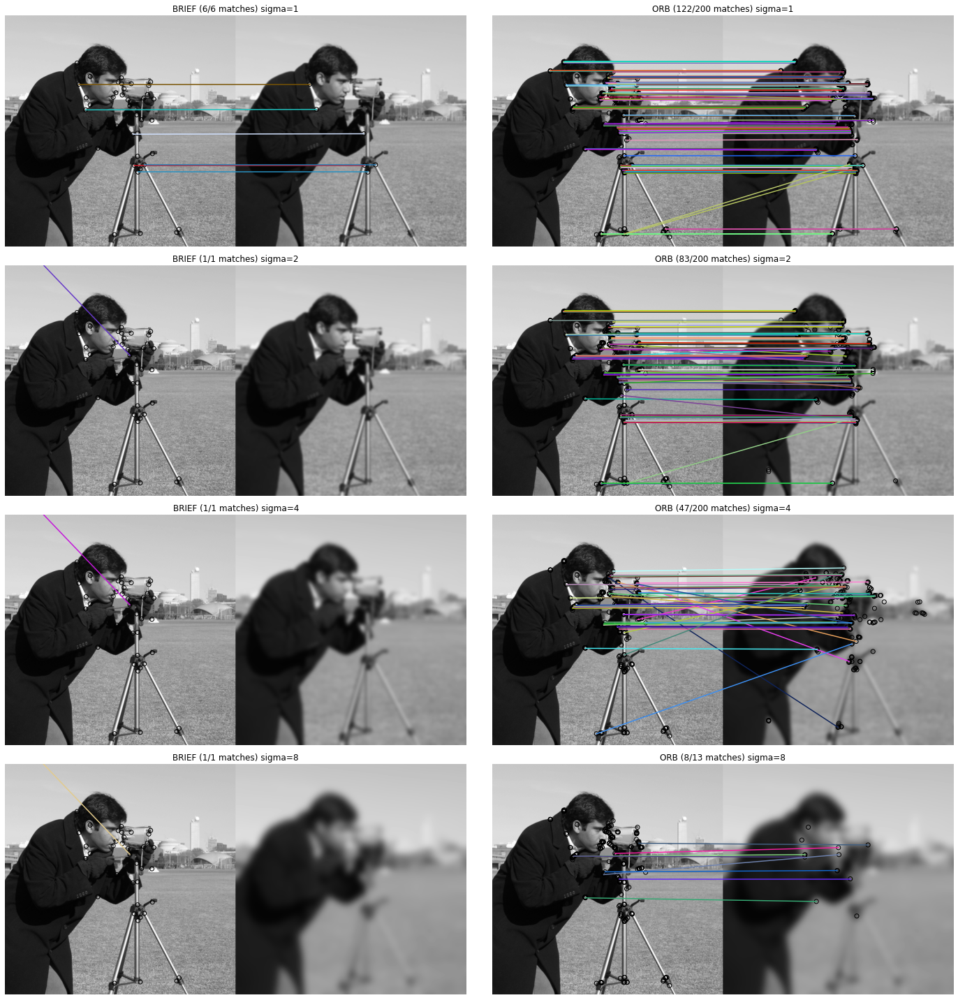

In [6]:
img1 = data.camera()
img1 = rgb2gray(img1)

fig, ax = plt.subplots(4, 2, figsize=(20, 20))
for i, sigma in enumerate([1, 2, 4, 8]):
    img2 = gaussian(img1, sigma=sigma)
    plot_descriptors_comparison(img1, img2, ax[i])

    # print sigma within title
    ax[i, 0].set_title(ax[i, 0].title.get_text() + f' sigma={sigma}')
    ax[i, 1].set_title(ax[i, 1].title.get_text() + f' sigma={sigma}')

plt.tight_layout()
plt.show()

In this last experiment we have tested the perfomance of the feature extractors and/or descriptors methods when blurring an image with a gaussian filter. The most remarkable results come from ORB.

With sigma=1, we see that ORB has found quite a few points, around 120. Despite being a good enough amount, it is interesting to realize how a subtle blur has prevented the algorithm to match 40% of the keypoints (80/200). With sigma=2 less matches have been found, but those that are found are correctly related. With sigma=4 something similar has happened, although with more incorrect matches. Lastly, with the last blurring that was produced with a gaussian filter of sigma=8, and certainly that is quite blurred/distorted, ORB has found very few matches. In fact, it has only been able to find 13 keypoints in the distorted image, and out of those 8 were matched. This last result is still fairly impressing because many of the points that were matched actually refer to the same region in the image in spite of that being very blurred, so that a surprisingly high precision in the matching has been maintained.

BRIEF applies a soft smoothing before extracting the descriptors (of sigma=1 by default). However, that does not affect the Harris detector which is applied one step earlier. In fact, BRIEF does not even get to match keypoints because these are not even detected to start with. Only in the first soft blur it is able to perfectly match 6 keypoints, however, from that point and on it is unable to detect any keypoint on the distorted image (note that the one pointing to the infinite is just a placeholder so as to still print the image).

In [9]:
img1 = data.astronaut()
img1 = rgb2gray(img1)
img2 = rotate(img1, angle=15)

def test_brief(img1, img2):
    harris_keypoints1 = corner_peaks(corner_harris(img1), min_distance=5,
                                threshold_rel=0.1)
    harris_keypoints2 = corner_peaks(corner_harris(img2), min_distance=5,
                                threshold_rel=0.1)
    brief = BRIEF()
    brief.extract(img1, harris_keypoints1)
    harris_keypoints1 = harris_keypoints1[brief.mask]
    brief_descriptors1 = brief.descriptors

    brief.extract(img2, harris_keypoints2)
    harris_keypoints2 = harris_keypoints2[brief.mask]
    brief_descriptors2 = brief.descriptors

def test_orb(img1, img2):
    orb = ORB(n_keypoints=50)
    orb.detect_and_extract(img1)
    orb_keypoints1 = orb.keypoints
    orb_descriptors1 = orb.descriptors

    orb.detect_and_extract(img2)
    orb_keypoints2 = orb.keypoints
    orb_descriptors2 = orb.descriptors


%timeit test_brief(img1, img2)
%timeit test_orb(img1, img2)

65.9 ms ± 588 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)
1.67 s ± 23.4 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


Here we can see that BRIEF is much faster than ORB, even though we know Harris corners and FAST are pretty much equal in terms of speed (part 1 of the practicum). However, on the one hand we must take into account that Harris proposes less corers, so then there are less descriptors to extract and compare/match. On the other hand it is still normal that ORB takes some more time because it has to do extra computations of the orientation of the patches and some other details it may have. In my opinion, in this case the efficiency does not prevail over the accuracy.

### Final word
All in all, there is not much to say from the comparisons. ORB always outperfomed BRIEF but that is something to be expected since ORB was built from the beginning to try to enhance and improve the drawbacks that BRIEF had. Apart from that, we have been able to test the consistency and robustness of ORB features on different distorted images. In the case of changes in the perspective, ORB managed to find some points regardless of the transformation while in some of them it even provided quite a few more. It could be seen that it depends on the image because some regions/objects in it could be detected and described more clearly than others. Finally, we also saw how ORB is robust to blurring as it took substantially large blur to make it interfere with the feature detection, but even at that point, it was able to find some proper matches. This last property could be useful in situations where a part of the scene is out of focus, since the effect is similar to a blur.